In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.model_selection import train_test_split

import nltk
from nltk.corpus import words
import re 
import spacy
from pandarallel import pandarallel

from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.linear_model import LogisticRegressionCV


from sklearn.metrics import accuracy_score , roc_curve , roc_auc_score, confusion_matrix  ,classification_report

In [2]:
# Importing the Datasets

df =  pd.read_excel(r"D:\Projects\NLP- Woman Clothing E-Commerce Platform\Womens Clothing Reviews Data.xlsx")

# a). Performing Exploratory Analysis on the data to Understand the Patterns

### Data Audit

In [3]:
df.head()

,Product ID,Category,Subcategory1,SubCategory2,Location,Channel,Customer Age,Review Title,Review Text,Rating,Recommend Flag
0,767,Initmates,Intimate,Intimates,Mumbai,Mobile,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1
1,1080,General,Dresses,Dresses,Bangalore,Mobile,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1
2,1077,General,Dresses,Dresses,Gurgaon,Mobile,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0
3,1049,General Petite,Bottoms,Pants,Chennai,Web,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1
4,847,General,Tops,Blouses,Bangalore,Web,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1


In [4]:
# Renaming Column names according to the Column naming conventions 

df.columns  = df.columns.str.replace(' ' ,'_')

In [5]:
# Checking Data info

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23486 entries, 0 to 23485
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Product_ID      23486 non-null  int64 
 1   Category        23472 non-null  object
 2   Subcategory1    23472 non-null  object
 3   SubCategory2    23472 non-null  object
 4   Location        23486 non-null  object
 5   Channel         23486 non-null  object
 6   Customer_Age    23486 non-null  int64 
 7   Review_Title    19676 non-null  object
 8   Review_Text     22641 non-null  object
 9   Rating          23486 non-null  int64 
 10  Recommend_Flag  23486 non-null  int64 
dtypes: int64(4), object(7)
memory usage: 2.0+ MB


In [6]:
# Creating a copy of the dataset to do the analysis and manipulations on 

df2 = df.copy()

In [7]:
# Dropping Product_ID column since all of its values are unique and it holds no prediction power

df2.drop(columns= 'Product_ID' , inplace = True) 

In [8]:
# Statistical summary for numerical columns : 

df2.describe()

,Customer_Age,Rating,Recommend_Flag
count,23486.000000,23486.000000,23486.000000
mean,43.198544,4.196032,0.822362
std,12.279544,1.110031,0.382216
min,18.000000,1.000000,0.000000
25%,34.000000,4.000000,1.000000
50%,41.000000,5.000000,1.000000
75%,52.000000,5.000000,1.000000
max,99.000000,5.000000,1.000000


In [9]:
# Statistical summary for categorical columns :

df2.describe(include = 'O')

,Category,Subcategory1,SubCategory2,Location,Channel,Review_Title,Review_Text
count,23472,23472,23472,23486,23486,19676,22641
unique,3,6,20,4,2,13993,22634
top,General,Tops,Dresses,Gurgaon,Web,Love it!,Perfect fit and i've gotten so many compliment...
freq,13850,10468,6319,8821,13583,136,3


In [10]:
# Checking for Missing values : 

df2.isna().sum()

Category            14
Subcategory1        14
SubCategory2        14
Location             0
Channel              0
Customer_Age         0
Review_Title      3810
Review_Text        845
Rating               0
Recommend_Flag       0
dtype: int64

In [11]:
# Dropping rows where Review Text and Review Title Both are missing

df2 = df2[df2['Review_Text'].notna()] # since rows with missing Review Text are also missig the Review Title

In [12]:
df2['Review_Title'] = np.where(df2['Review_Title'].isna() , '' , df2['Review_Text']) 

In [13]:
# creating a combined column for Review_text and Review_title

df2['Combined_text']  = df2['Review_Text']+ " " + df2['Review_Title']

In [14]:
# Checking for Duplicates

df2[df2.duplicated()]

,Category,Subcategory1,SubCategory2,Location,Channel,Customer_Age,Review_Title,Review_Text,Rating,Recommend_Flag,Combined_text


In [15]:
# Value Distribution of Each Catgorical Column

for m in df2[['Category', 'Subcategory1', 'SubCategory2', 'Location', 'Channel']]:
    print("*" * 80)
    print()
    print('\t\t\t\t',m)
    print()
    print("*" * 80)
    print(df[m].value_counts())

********************************************************************************

				 Category

********************************************************************************
Category
General           13850
General Petite     8120
Initmates          1502
Name: count, dtype: int64
********************************************************************************

				 Subcategory1

********************************************************************************
Subcategory1
Tops        10468
Dresses      6319
Bottoms      3799
Intimate     1735
Jackets      1032
Trend         119
Name: count, dtype: int64
********************************************************************************

				 SubCategory2

********************************************************************************
SubCategory2
Dresses           6319
Knits             4843
Blouses           3097
Sweaters          1428
Pants             1388
Jeans             1147
Fine gauge        1100
Skirts             945
Jackets

# Exploratory Data Analysis

## Univariate Analysis

In [16]:
 px.histogram(df2, x = 'Customer_Age' , title = 'Customer Age Distribution' ,labels={'Customer_Age': 'Customer Age', 'count': 'Frequency'}).update_layout(yaxis_title='Frequency')

In [17]:
# Customer Age Distribution 

fig = px.histogram(df2, x = 'Customer_Age' , title = 'Customer Age Distribution' )
fig.update_layout(
                    yaxis_title = "Count",
                    xaxis_title = "Customer Age",  # Label for the x-axis
                    bargroupgap = 0.1 ,
                    margin = dict(t = 50, r = 10 , b = 40, l = 60 )
)
fig.show()

In [18]:
# Channel Distribution 

fig  = px.histogram(df, x = 'Channel' , title = 'Channel Distribution' , color = 'Channel')
fig.update_layout(
                    yaxis_title = "Count",
                    xaxis_title = "Channel",  # Label for the x-axis
                    bargroupgap = 0.1 ,
                    margin = dict(t = 50, r = 10 , b = 40, l = 60 )
)
fig.show()

C:\Users\shivi\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [19]:

# Category Distribution 

fig  = px.histogram(df2, x = 'Category' , title = 'Category Distribution' , color = 'Category')
fig.update_layout(
                    yaxis_title = "Count",
                    xaxis_title = "Channel",  # Label for the x-axis
                    bargroupgap = 0.1 ,
                    margin = dict(t = 50, r = 10 , b = 40, l = 60 )
)
fig.show()

C:\Users\shivi\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [20]:
# Subcategory1 Distribution 

fig  = px.histogram(df2, x = 'Subcategory1' , title = 'Subcategory1 Distribution'  , color = 'Subcategory1' )

fig.update_layout(
                    yaxis_title = "Count",
                    xaxis_title = "Subcategory 1",  # Label for the x-axis
                    bargroupgap = 0.1 ,
                    margin = dict(t = 50, r = 10 , b = 40, l = 60 )
)
fig.show()

C:\Users\shivi\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [21]:
# Subcategory2 Distribution 

fig  = px.histogram(df2, x = 'SubCategory2' , title = 'Subcategory-2 Distribution'  , color = 'SubCategory2' )

fig.update_layout(
                    yaxis_title = "Count",
                    xaxis_title = "Subcategory 2",  # Label for the x-axis
                    bargroupgap = 0.1 ,
                    margin = dict(t = 50, r = 10 , b = 40, l = 60 )
)
fig.show()

C:\Users\shivi\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [22]:
# Location Distribution 

fig  = px.histogram(df2, x = 'Location' , title = 'Location Distribution'  , color = 'Location' )

fig.update_layout(
                    yaxis_title = "Count",
                    xaxis_title = "Location",  # Label for the x-axis
                    bargroupgap = 0.1 ,
                    margin = dict(t = 50, r = 10 , b = 40, l = 60 )
)
fig.show()

C:\Users\shivi\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



## Compositional Analysis 

In [23]:
# Categorical Composition

px.pie(df2 , names = 'Category' ,title = 'Categorical Composition')

In [24]:
# 1st Sub-Categorical Composition

px.pie(df2 , names = 'Subcategory1' ,title = '1st Sub-Categorical Composition')

In [25]:
# 2nd Sub-Categorical Composition

px.pie(df2 , names = 'SubCategory2' ,title = '2nd Sub-Categorical Composition')

## Bivariate Analyis

In [26]:
# Sales of the Categories at different Locations

px.histogram(df, x = 'Location' , title = 'Sales of the Categories at different Locations' , color = 'Category')

C:\Users\shivi\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [27]:
# Age wise Usage of Channels

px.histogram(df, x = 'Customer_Age' , title = 'Age wise Usage of Channels'  ,  color = 'Channel')

## we can see that web usage has been more popular thoughout the Age Distribution with customers of age around 39 showing the highest usage.

C:\Users\shivi\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



## b). Perform text mining tasks to understand what most frequent words are using for positive sentiment and negative sentiment. Create word clouds for the positive & negative reviews separately.

In [28]:
# Creating a function for Cleaning the text : 

nlp = spacy.load("en_core_web_lg")

def clean_text(text , nlp):
    doc = nlp(text)
    clean_text = ""
    special_characters = '+@$%^&*()?#.,\;'
    for token in doc:
        if not token.is_stop and not token.is_punct and token.is_alpha and str(token) not in special_characters:
            clean_text = clean_text + " " + token.lemma_.lower()
    return clean_text.strip()

In [29]:
positive_reviews = df2[df2['Recommend_Flag'] == 1]
negative_reviews = df2[df2['Recommend_Flag'] == 0]

In [30]:
# !pip install pandarallel

from pandarallel import pandarallel

pandarallel.initialize(progress_bar= True)

INFO: Pandarallel will run on 8 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


In [31]:
positive_reviews['clean_text'] = positive_reviews['Combined_text'].parallel_apply(clean_text ,nlp = nlp)

C:\Users\shivi\AppData\Local\Temp\ipykernel_25856\934731478.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [32]:
negative_reviews['clean_text'] = negative_reviews['Combined_text'].parallel_apply(clean_text , nlp = nlp )

C:\Users\shivi\AppData\Local\Temp\ipykernel_25856\892433154.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Most Frequent Words used for Positive Sentiment :

In [33]:
# checking the cleaned words

pos_sen = []
for m in positive_reviews['clean_text'].str.split():
    if type(m) == list: 
        for m in m:
            pos_sen.append(m)
    else:
        pos_sen.append(m)
        
words = pd.DataFrame(pos_sen)
words.columns = ['words']
words['words'].value_counts()[0:50]

words
dress          18732
fit            17776
love           16766
wear           16761
size           16527
look           12979
color          11289
like           11011
great          10426
small           8146
order           7576
buy             6969
fabric          6846
perfect         6722
little          6425
soft            5922
flattering      5685
comfortable     5398
try             5390
long            5361
large           5187
think           5182
nice            5067
get             4987
bit             4871
run             4855
cute            4624
beautiful       4538
jean            4512
length          4433
short           4430
shirt           4427
feel            4391
work            4344
sweater         4235
petite          4061
go              3992
material        3909
purchase        3903
medium          3788
good            3636
skirt           3626
waist           3615
pretty          3551
xs              3531
store           3418
pant            3365
retaile

In [34]:
#!pip install wordcloud

In [35]:
from wordcloud import WordCloud

In [36]:
pos_sen_clean = " ".join(pos_sen)

In [37]:
word_cloud  =  WordCloud(width = 800, height = 800,background_color ='white', min_font_size = 10).generate(pos_sen_clean)

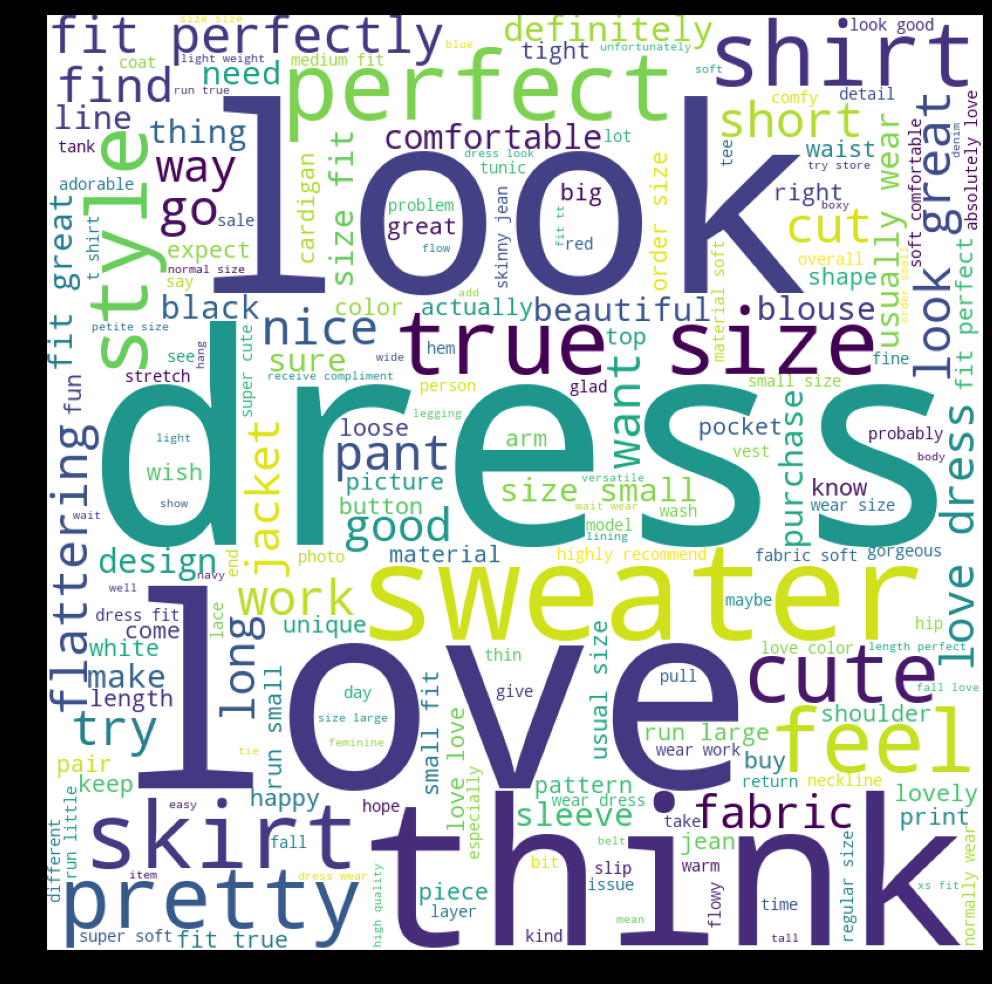

In [38]:
plt.figure(figsize= (10,10), facecolor='k')
plt.imshow(word_cloud)
plt.tight_layout()
plt.show()

### Most Frequent Words used for Negative Sentiment :

In [39]:
# checking the cleaned words

neg_sen = []
for m in negative_reviews['clean_text'].str.split():
    if type(m) == list: 
        for m in m:
            neg_sen.append(m)
    else:
        neg_sen.append(m)
        
words = pd.DataFrame(neg_sen)
words.columns = ['words']
words['words'].value_counts()[0:50]

words
look          4496
dress         4000
like          3634
fit           3108
size          2830
love          2477
fabric        2389
wear          2336
small         2012
color         1950
order         1906
return        1680
try           1523
material      1395
shirt         1375
think         1351
way           1238
large         1227
go            1227
short         1222
want          1163
work          1149
feel          1141
quality       1047
cute          1009
great          979
sweater        955
big            916
run            905
cut            886
long           886
beautiful      873
waist          863
pretty         834
buy            830
model          828
retailer       826
picture        825
design         819
flattering     817
good           816
nice           812
arm            777
sleeve         712
get            710
thin           704
online         703
little         693
tight          667
xs             656
Name: count, dtype: int64

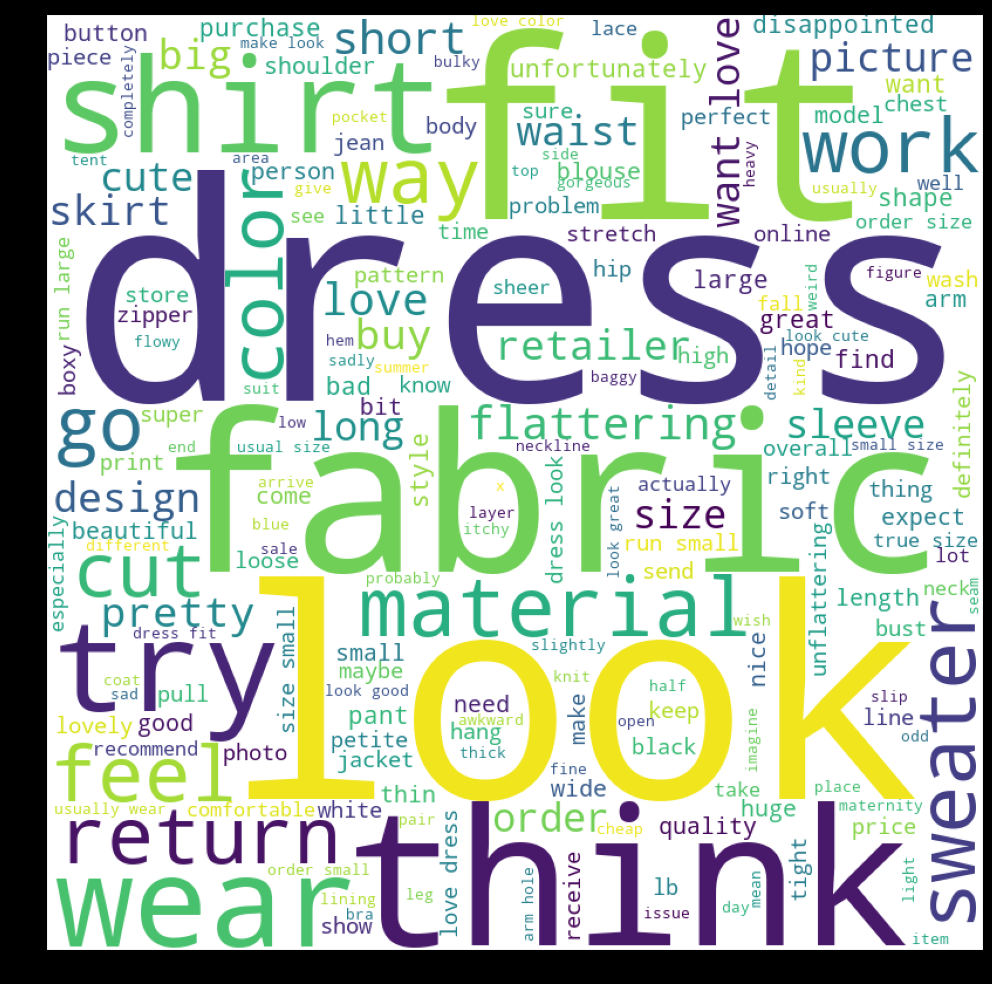

In [40]:
neg_sen_clean = " ".join(neg_sen)

word_cloud  =  WordCloud(width = 800, height = 800,background_color ='white', min_font_size = 10).generate(neg_sen_clean)

plt.figure( figsize= (10,10), facecolor='k')
plt.imshow(word_cloud)
plt.tight_layout()
plt.show()

## c). Understand sentiment among the customers on the different categories, sub categories, products by location and age group

In [41]:
df3 = df2.copy()
df3['Customer_Age'] = df3['Customer_Age'].astype('str')
df3['Recommend_Flag'] = df3['Recommend_Flag'].astype('str')

In [42]:
# Sentiment among the customers on different Categories

px.histogram(df3, x = 'Category' , title = 'Sentiment among the customers on different Categories' , color= 'Recommend_Flag')

C:\Users\shivi\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [43]:
# Sentiment among the customers on different Sub-Categories1

px.histogram(df3, x = 'Subcategory1' , title = 'Sentiment among the customers on different Sub-Categories1' , color= 'Recommend_Flag')

C:\Users\shivi\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [44]:
# Sentiment among the customers on different Sub-Categories

px.histogram(df3, x = 'SubCategory2' , title = 'Sentiment among the customers on different Sub-Categories' , color= 'Recommend_Flag')

C:\Users\shivi\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [45]:
# Sentiment among the customers at different locations

px.histogram(df3, x = 'Location' , title = 'Sentiment among the customers at different locations' , color= 'Recommend_Flag')

C:\Users\shivi\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [46]:
# Sentiment among the customers of Different Age Groups

px.histogram(df3, x = 'Customer_Age' , title = 'Sentiment among the customers of Different Age Groups' , color= 'Recommend_Flag')

C:\Users\shivi\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



## d. Perform predictive analytics to understand the drivers of customers who are recommending the products

In [47]:
# Separating the Target and Features

X = pd.DataFrame(df2['Combined_text'])
y = pd.DataFrame(df2['Recommend_Flag'])

In [48]:
# Train-Test Split
 
X_train , X_test , y_train , y_test = train_test_split(X , y , test_size = 0.2 , random_state = 123,  stratify = y )

In [49]:
### Defining a clean_text function for Text Cleaning

# Initializing spacy : 

nlp = spacy.load("en_core_web_lg")

# DEfining the function : 

def clean_text(text , nlp):
    doc = nlp(text)
    clean_text = ""
    special_characters = '+@$%^&*()?#.,\;'
    for token in doc:
        if not token.is_stop and not token.is_punct and token.is_alpha and str(token) not in special_characters:
            clean_text = clean_text + " " + token.lemma_.lower()
    return clean_text.strip()

In [50]:
# !pip install pandarallel

from pandarallel import pandarallel

pandarallel.initialize(progress_bar= True)

INFO: Pandarallel will run on 8 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


In [51]:
# Cleaning the Train Data

X_train['Combined_clean_text'] = X_train['Combined_text'].parallel_apply(clean_text , nlp = nlp )

In [52]:
# Cleaning the Test Data

X_test['Combined_clean_text'] = X_test['Combined_text'].parallel_apply(clean_text ,nlp  =nlp)

In [53]:
# Initializing TF-IDF vectorizer

tfidf = TfidfVectorizer(smooth_idf=True, ngram_range=(1, 2), min_df=20)

In [54]:
# Transform train and test data to TF-IDF features

X_train_tfidf = tfidf.fit_transform(X_train['Combined_clean_text'])
X_test_tfidf = tfidf.transform(X_test['Combined_clean_text'])

In [55]:
# Initializing and Training the logistic regression model

logit = LogisticRegressionCV(Cs=10, max_iter=50, solver='liblinear', n_jobs=-1)
logit.fit(X_train_tfidf, y_train)

C:\Users\shivi\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



LogisticRegressionCV(max_iter=50, n_jobs=-1, solver='liblinear')

In [56]:
# Making Predictions on train and test data

train_preds_logit = logit.predict(X_train_tfidf)

test_preds_logit = logit.predict(X_test_tfidf)

In [57]:
# Accuracy 

print("Train Accuracy : " , accuracy_score(y_train, train_preds_logit))
print()
print("Test Accuracy : " , accuracy_score(y_test, test_preds_logit))

Train Accuracy :  0.9239178445229682

Test Accuracy :  0.8818723780083904


In [58]:
# Confusion Matrix

print("Training Confusion Matrix :\n", confusion_matrix(y_train, train_preds_logit))
print()
print("Test Confusion Matrix :\n", confusion_matrix(y_test, test_preds_logit))

Training Confusion Matrix :
 [[ 2213  1068]
 [  310 14521]]

Test Confusion Matrix :
 [[ 437  383]
 [ 152 3557]]


In [59]:
# Classification Report 

print("Training Classification Report :\n", classification_report(y_train, train_preds_logit))
print()
print("Test Classification Report :\n", classification_report(y_test, test_preds_logit))

Training Classification Report :
               precision    recall  f1-score   support

           0       0.88      0.67      0.76      3281
           1       0.93      0.98      0.95     14831

    accuracy                           0.92     18112
   macro avg       0.90      0.83      0.86     18112
weighted avg       0.92      0.92      0.92     18112


Test Classification Report :
               precision    recall  f1-score   support

           0       0.74      0.53      0.62       820
           1       0.90      0.96      0.93      3709

    accuracy                           0.88      4529
   macro avg       0.82      0.75      0.78      4529
weighted avg       0.87      0.88      0.87      4529



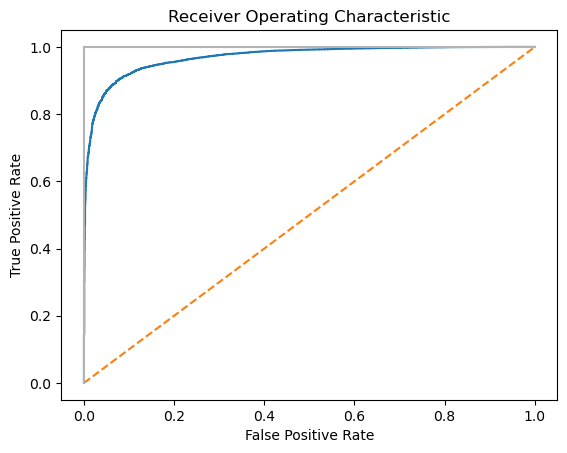

In [60]:
### ROC AUC Curve for Train Set  :

target_probabilities_train = logit.predict_proba(X_train_tfidf)[:,1]

# Create true and false positive rates

false_positive_rate_train, true_positive_rate_train, threshold = roc_curve( y_train, target_probabilities_train )
# Plot ROC curve

plt.title("Receiver Operating Characteristic")
plt.plot(false_positive_rate_train, true_positive_rate_train)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.show()

In [61]:
### ROC AUC Score for Train Set

print('Train ROC AUC Score : ' , roc_auc_score(y_train, target_probabilities_train))

Train ROC AUC Score :  0.9693215922044056


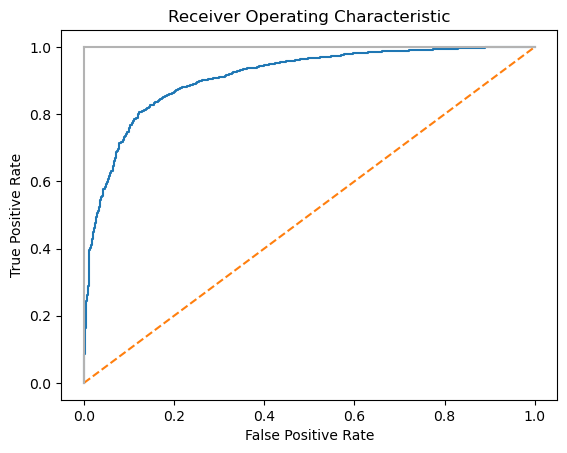

In [62]:
### ROC AUC Curve for Test Set  :

target_probabilities_test = logit.predict_proba(X_test_tfidf)[:,1]

# Create true and false positive rates

false_positive_rate_test, true_positive_rate_test, threshold_test = roc_curve( y_test, target_probabilities_test )
# Plot ROC curve

plt.title("Receiver Operating Characteristic")
plt.plot(false_positive_rate_test, true_positive_rate_test)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.show()

In [63]:
### ROC AUC Score for Test Set

print('Test ROC AUC Score : ' , roc_auc_score(y_test, target_probabilities_test))

Test ROC AUC Score :  0.9102588298732813
